---
title: "Replicating 2D Value & Quality Factors in Indian Equities (Script)"
date: "2024-12-05"
authors:
  - name: "Andrew Park"
---

In [1]:
import pandas as pd
import numpy as np
from io import StringIO
import datetime as dt
import os
import matplotlib.pyplot as plt
import plotly.graph_objects as go
import plotly.io as pio
from scipy.stats import zscore
import plotly.express as px
import warnings
warnings.filterwarnings("ignore")

# Adjusted Prices + Dividends

In [3]:
# Define file paths
file_path_price = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Trading.txt"
file_path_identity = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Identity.txt"
file_path_radj = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Adjustment Factor.txt"
file_path_dividend = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Dividend.txt"

# Read the price data
with open(file_path_price, 'r') as file:
    content_price = file.read()
data_price = StringIO(content_price)
df_price = pd.read_csv(data_price, sep='|', header=0, parse_dates=['co_stkdate'])

# Read the identity data
with open(file_path_identity, 'r') as file:
    content_identity = file.read()
data_identity = StringIO(content_identity)
df_identity = pd.read_csv(data_identity, sep='|', header=0)

# Read the adjustment factor data
with open(file_path_radj, 'r') as file:
    content_radj = file.read()
data_radj = StringIO(content_radj)
df_radj = pd.read_csv(data_radj, sep='|', header=0, parse_dates=['radjfact_date'])

# Read the dividend data
with open(file_path_dividend, 'r') as file:
    content_dividend = file.read()
divs = pd.read_csv(file_path_dividend, sep='|', header=0, parse_dates=['div_announcement_date', 'nse_exdiv_date'])
divs = divs.merge(df_identity.loc[:, ['company_name', 'nse_symbol']], on='company_name')

# Merging Ticker Information
df_price = df_price.merge(df_identity.loc[:, ['company_name', 'nse_symbol', 'co_industry_name']], how='inner', on='company_name')
df_radj = df_radj.merge(df_identity.loc[:, ['company_name', 'nse_symbol']], how='inner', on='company_name')

# Filtering for NSE
df_radj = df_radj.loc[df_radj['radj_exch'] == 'NSE', ['nse_symbol', 'radj_factor', 'radjfact_date']]

# Print the first few rows of the DataFrames to inspect
print("Price Data:\n", df_price.head())
print("\nAdjustment Factor Data:\n", df_radj.head())
print("\nDividend Data:\n", divs.head())

Price Data:
    co_code     company_name co_stkdate  nse_opening_price  nse_high_price  \
0       11  20 MICRONS LTD. 2014-09-01               34.3           35.35   
1       11  20 MICRONS LTD. 2014-09-02               34.8           34.85   
2       11  20 MICRONS LTD. 2014-09-03               34.9           34.90   
3       11  20 MICRONS LTD. 2014-09-04               33.0           33.45   
4       11  20 MICRONS LTD. 2014-09-05               32.5           32.75   

   nse_low_price  nse_closing_price  nse_returns  nse_traded_qty  \
0          32.05              34.50         1.02         53094.0   
1          33.50              33.70         0.98         48441.0   
2          32.50              32.85         0.97         53483.0   
3          31.00              31.95         0.97         94219.0   
4          31.55              31.95         1.00        109866.0   

   nse_traded_val  ...    nse_pe  nse_pb  nse_bv_per_share  \
0             1.8  ...  108.0230  1.5582           22

In [4]:
# Pivoting DataFrames
unadj_prices = df_price.pivot(index='co_stkdate', columns='nse_symbol', values='nse_closing_price')
adjfactors = df_radj.pivot_table(values='radj_factor', index='radjfact_date', columns='nse_symbol', aggfunc='prod')

In [5]:
# create a df of dividends the index of which matches the unadjPrice index

def createDivAdj(srs: pd.Series, divDf: pd.DataFrame):
    """
    Create a df of dividends the index of which matches the unadjPrice index.
    This will enable matrix operations instead of loops

    Args:
        srs (Series): Unadjusted Prices of a particular ticker
        divDf (DataFrame): Cash Dividend

    Returns:
        _type_: _description_
    """
    symbol = srs.name
    stkDiv = divDf.loc[divDf.nse_symbol == symbol, ['nse_exdiv_date', 'div_per_share']]
    stkDiv.drop_duplicates(subset = 'nse_exdiv_date', inplace = True)
    stkDiv.set_index('nse_exdiv_date', inplace = True)
    stkDiv = stkDiv.reindex(srs.index)
    stkDiv.columns = [srs.name]
    return stkDiv


cols, allSrs = zip(*unadj_prices.items())
finalDivs = pd.concat(list(map(createDivAdj, allSrs, [divs] * len(allSrs))), axis = 1)
divPct = (1 - finalDivs/unadj_prices)


def adjClose(srs, splits, dividendPct):

    ast = srs.name
    adjCloseSrs = srs.copy(deep = True)

    if ast in splits.columns:
        stkSplit = splits[ast].dropna()
        for date, split in stkSplit.items():
                adjCloseSrs[adjCloseSrs.index < date] *= split

    else:
        pass

    if ast in dividendPct.columns:
        stkDivPct = dividendPct[ast].dropna() #----> this is important to make sure we only adjust prior to ex-div date
        for newdate, dpct in stkDivPct.items():
                adjCloseSrs[adjCloseSrs.index < newdate] *= dpct
    else:
        pass
        
    return adjCloseSrs

adjPrices = unadj_prices.apply(lambda x: adjClose(x, adjfactors, divPct))
adjPrices.dropna(axis= 1, how = 'all', inplace = True)

In [6]:
df_adjprices = adjPrices.reset_index().melt(id_vars='co_stkdate', var_name='nse_symbol', value_name='adjPrice')
df_adjprices

,co_stkdate,nse_symbol,adjPrice
0,2014-09-01,20MICRONS,32.688000
1,2014-09-02,20MICRONS,31.930017
2,2014-09-03,20MICRONS,31.124661
3,2014-09-04,20MICRONS,30.271931
4,2014-09-05,20MICRONS,30.271931
...,...,...,...
2804375,2024-09-24,ZYDUSWELL,2026.400000
2804376,2024-09-25,ZYDUSWELL,1988.600000
2804377,2024-09-26,ZYDUSWELL,1981.900000
2804378,2024-09-27,ZYDUSWELL,2013.000000


In [7]:
def cnvrt_daily_to(dataframe, convert_to='m'):
    if convert_to == 'm':
        return dataframe.resample('ME').last()
    elif convert_to == 'q':
        return dataframe.resample('Q').last()
    elif convert_to == 'w':
        return dataframe.resample('W').last()
    else:
        raise ValueError("Invalid conversion period specified. Use 'm' for monthly, 'q' for quarterly, or 'w' for weekly.")

def hpr(ret, init_wgt):
    arth_rets = 1 + ret
    cumrets = arth_rets.cumprod()
    port_ret = (cumrets * init_wgt).sum(axis=1)
    return port_ret

# Normalizing all prices to 1
def get_eq_line(series):
    return series / series.iloc[0]

# Assuming adjPrices is your DataFrame with adjusted prices
# Ensure that the index is a DatetimeIndex
adjPrices.index = pd.to_datetime(adjPrices.index)
dailyEqLines = adjPrices.apply(lambda x: get_eq_line(x))

# Convert daily data to the desired frequency (monthly, quarterly, or weekly)
monthlyEqLines = cnvrt_daily_to(dailyEqLines, convert_to='m')

# Unbiased Nifty 500 (Equal-Weighted)

In [ ]:
# Initialize variables
dts = monthlyEqLines.index
multiplier = 1
portRet = []
rebalannceFreq = 3

# Loop over dates to calculate portfolio returns for the entire index
for idx, dt in enumerate(dts):
    if idx < len(dts) - rebalannceFreq:
        if idx % rebalannceFreq == 0:
            tplus = dts[idx + rebalannceFreq]
            end = dt
            currentStocks = monthlyEqLines.loc[dt].dropna().index
            
            if len(currentStocks) > 0:
                intraPeriodPrices = adjPrices.loc[dt:tplus, currentStocks].ffill()
                intraPeriodRets = np.log(intraPeriodPrices / intraPeriodPrices.shift(1)).dropna(axis=0, how='all')
                wgts = np.ones_like(currentStocks) / len(currentStocks)
                holdingRet = (hpr(ret=intraPeriodRets, init_wgt=wgts) * multiplier)
                multiplier = holdingRet.iloc[-1]
                portRet.append(holdingRet)

# Concatenate the returns for the entire index
if portRet:
    index_portfolio_returns = pd.concat(portRet)

# Create an interactive plot using Plotly
fig = go.Figure()

fig.add_trace(go.Scatter(x=index_portfolio_returns.index, y=index_portfolio_returns.values, mode='lines', name='Index'))

fig.update_layout(
    title='Equal-Weighted Nifty 500 Index (Unbiased)',
    xaxis_title='Date',
    yaxis_title='Cumulative Returns',
    legend_title='Index',
    template='plotly'  # Optional: You can use 'plotly', 'plotly_dark', or other themes
)

fig.show()

# Nifty 500 Universe Returns

In [ ]:
# Assuming adjPrices and monthlyEqLines are already defined and set up
dts = monthlyEqLines.index
window = 0
multiplier = 1
portRet = []
rebalannceFreq = 1
tCost = {}
stockList = {}

# Initialize a dictionary to store portfolio returns for each stock
stock_portfolio_returns = {}

# Loop over each stock and calculate portfolio returns
for stock in monthlyEqLines.columns:
    portRet = []
    multiplier = 1
    for idx, dt in enumerate(dts):
        if (idx >= window) and (idx < len(dts) - rebalannceFreq):
            if idx % rebalannceFreq == 0:
                tplus = dts[idx + rebalannceFreq]
                end = dt
                currentStock = monthlyEqLines.loc[dt, stock]
                
                if not pd.isna(currentStock):
                    intraPeriodPrices = adjPrices.loc[dt:tplus, stock].ffill()
                    intraPeriodRets = np.log(intraPeriodPrices / intraPeriodPrices.shift(1)).dropna()
                    
                    if not intraPeriodRets.empty:
                        intraPeriodRets = intraPeriodRets.to_frame()  # Convert Series to DataFrame
                        wgts = np.array([1])  # Weight is 1 since we're looking at individual stocks
                        holdingRet = (hpr(ret=intraPeriodRets, init_wgt=wgts) * multiplier)
                        multiplier = holdingRet.iloc[-1]
                        portRet.append(holdingRet)
    
    # Concatenate and store the returns for the current stock
    if portRet:
        stock_portfolio_returns[stock] = pd.concat(portRet)

# Create an interactive plot using Plotly
fig = go.Figure()

for stock, returns in stock_portfolio_returns.items():
    fig.add_trace(go.Scatter(x=returns.index, y=returns.values, mode='lines', name=stock))

fig.update_layout(
    title='10 Year Returns for Nifty 500 Universe',
    xaxis_title='Date',
    yaxis_title='Cumulative Returns',
    legend_title='Stock',
    template='plotly'  # Optional: You can use 'plotly', 'plotly_dark', or other themes
)

fig.show()

# Profitability

### 1. Gross Profit Margin
$$
\text{Gross Profit Margin} = \frac{\text{Gross Sales} - \text{Total Expenses}}{\text{Gross Sales}} \times 100
$$

### 2. Operating Profit Margin (EBIT Margin)
$$
\text{Operating Profit Margin} = \frac{\text{Income from Operations (EBIT)}}{\text{Net Sales}} \times 100
$$

### 3. Net Profit Margin
$$
\text{Net Profit Margin} = \frac{\text{Profit After Tax (PAT)}}{\text{Net Sales}} \times 100
$$

### 4. Return on Assets (ROA)
$$
\text{Return on Assets (ROA)} = \frac{\text{Profit After Tax (PAT)}}{\text{Shareholders' Funds} + \text{Total Expenses}} \times 100
$$

### 5. Return on Equity (ROE)
$$
\text{Return on Equity (ROE)} = \frac{\text{Profit After Tax (PAT)}}{\text{Shareholders' Funds}} \times 100
$$

### 6. EBITDA Margin
$$
\text{EBITDA Margin} = \frac{\text{Income from Operations (EBIT)} + \text{Depreciation}}{\text{Net Sales}} \times 100
$$

### 7. Return on Sales (ROS)
$$
\text{Return on Sales (ROS)} = \frac{\text{Profit After Tax (PAT)}}{\text{Net Sales}} \times 100
$$

### 8. Cash Flow to Sales Ratio
$$
\text{Cash Flow to Sales Ratio} = \frac{\text{Cash Flow from Operating Activities}}{\text{Net Sales}} \times 100
$$

### 9. Earnings Per Share (EPS Diluted)
$$
\text{Earnings Per Share (EPS Diluted)} = \text{Diluted EPS (as reported)}
$$

### 10. Operating Expenses to Sales Ratio
$$
\text{Operating Expenses to Sales Ratio} = \frac{\text{Total Expenses}}{\text{Net Sales}} \times 100
$$

### 11. Interest Coverage Ratio
$$
\text{Interest Coverage Ratio} = \frac{\text{Income from Operations (EBIT)}}{\text{Interest Expenses}}
$$


### Profitability Field Legend

ciq_ntrm_net_sales = Net sales revenue during the interim period (total revenue minus returns and allowances).

ciq_ntrm_inc_frm_oper = Income from operations, or operating profit, calculated before interest and tax.

ciq_ntrm_gross_sales = Gross sales (before any deductions like returns or discounts).

ciq_ntrm_total_exp = Total expenses during the interim period.

ciq_ntrm_wages_salaries = Total wages and salaries paid to employees during the period.

ciq_ntrm_interest_exp = Interest expenses during the period (cost of borrowed funds).

ciq_ntrm_depreciation = Depreciation expenses (allocation of the cost of tangible assets over their useful lives).

ciq_ntrm_total_tax_prov = Total tax provisions made during the interim period (expected tax liability).

ciq_ntrm_after_tax_profit_loss_contin_oper = Profit or loss after tax from continuing operations (i.e., excluding one-time items or discontinued operations).

ciq_ntrm_pat = Profit After Tax (net earnings after taxes are deducted).

ciq_ntrm_pat_pc_ntrm_net_sales = Profit After Tax as a percentage of net sales.

ciq_ntrm_eps_diluted_aft_xtraord_item = Diluted Earnings Per Share (EPS) after extraordinary items (includes the impact of potential shares from options, warrants, etc.).

ciq_ntrm_shareholders_funds = Total shareholder equity (the total net assets attributable to shareholders).

ciq_ntrm_cf_net_operating_activity = Net cash flow from operating activities (the cash generated or used by the company’s core business operations).

In [13]:
# Define file paths
file_path_quarterly = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Quarterly.txt"
file_path_sector = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Sector.txt"
file_path_calendar = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Calendar.txt"

# Read the quarterly data
df_quarterly = pd.read_csv(file_path_quarterly, sep='|', header=0, low_memory=False)
df_sector = pd.read_csv(file_path_sector, sep='|', header=0)
df_calendar = pd.read_csv(file_path_calendar, sep='|', header=0)
# Calculate Profitability Metrics

# 1. Gross Profit Margin
df_quarterly['Gross Profit Margin (%)'] = ((df_quarterly['ciq_ntrm_gross_sales'] - df_quarterly['ciq_ntrm_total_exp']) / df_quarterly['ciq_ntrm_gross_sales']) * 100

# 2. Operating Profit Margin (EBIT Margin)
df_quarterly['Operating Profit Margin (%)'] = (df_quarterly['ciq_ntrm_inc_frm_oper'] / df_quarterly['ciq_ntrm_net_sales']) * 100

# 3. Net Profit Margin
df_quarterly['Net Profit Margin (%)'] = (df_quarterly['ciq_ntrm_pat'] / df_quarterly['ciq_ntrm_net_sales']) * 100

# 4. Return on Assets (ROA)
df_quarterly['Return on Assets (ROA %)'] = (df_quarterly['ciq_ntrm_pat'] / (df_quarterly['ciq_ntrm_shareholders_funds'] + df_quarterly['ciq_ntrm_total_exp'])) * 100

# 5. Return on Equity (ROE)
df_quarterly['Return on Equity (ROE %)'] = (df_quarterly['ciq_ntrm_pat'] / df_quarterly['ciq_ntrm_shareholders_funds']) * 100

# 6. EBITDA Margin (EBITDA = Operating Profit + Depreciation + Interest Expense)
df_quarterly['EBITDA Margin (%)'] = ((df_quarterly['ciq_ntrm_inc_frm_oper'] + df_quarterly['ciq_ntrm_depreciation'] + df_quarterly['ciq_ntrm_interest_exp']) / df_quarterly['ciq_ntrm_net_sales']) * 100

# 7. Return on Sales (ROS)
df_quarterly['Return on Sales (ROS %)'] = (df_quarterly['ciq_ntrm_pat'] / df_quarterly['ciq_ntrm_net_sales']) * 100

# 8. Cash Flow to Sales Ratio
df_quarterly['Cash Flow to Sales Ratio (%)'] = (df_quarterly['ciq_ntrm_cf_net_operating_activity'] / df_quarterly['ciq_ntrm_net_sales']) * 100

# 9. Earnings Per Share (EPS Diluted)
df_quarterly['EPS Diluted'] = df_quarterly['ciq_ntrm_eps_diluted_aft_xtraord_item']

# 10. Operating Expenses to Sales Ratio
df_quarterly['Operating Expenses to Sales Ratio (%)'] = (df_quarterly['ciq_ntrm_total_exp'] / df_quarterly['ciq_ntrm_net_sales']) * 100

# 11. Interest Coverage Ratio (Income from Operations / Interest Expense)
df_quarterly['Interest Coverage Ratio'] = df_quarterly['ciq_ntrm_inc_frm_oper'] / df_quarterly['ciq_ntrm_interest_exp']

# Creating the profitability DataFrame by merging relevant columns from quarterly data with identity data
df_profitability = df_quarterly.merge(df_identity[['company_name', 'nse_symbol']], how='inner', left_on='ciq_company_name', right_on='company_name')

# Add the sector column by merging with the sector data on 'nse_symbol'
df_profitability = df_profitability.merge(df_sector[['nse_symbol', 'sector']], how='left', on='nse_symbol')

# Convert 'ciq_ntrm_date' to string (if not already)
df_profitability['ciq_ntrm_date'] = df_profitability['ciq_ntrm_date'].astype(str)

# Convert 'YYYYMMDD' to 'MM/YY'
df_profitability['ciq_ntrm_date'] = df_profitability['ciq_ntrm_date'].str.slice(4, 6) + '/' + df_profitability['ciq_ntrm_date'].str.slice(2, 4)

df_profitability = df_profitability.merge(
    df_calendar[['nse_symbol', 'ciq_ntrm_date', 'ann_date']],
    how='left', 
    left_on=['nse_symbol', 'ciq_ntrm_date'], 
    right_on=['nse_symbol', 'ciq_ntrm_date']
)

# Ensure ann_date is in datetime format
df_profitability['ann_date'] = pd.to_datetime(df_profitability['ann_date'], errors='coerce')

# Group by ciq_ntrm_date and calculate the average ann_date
average_ann_date = df_profitability.groupby('ciq_ntrm_date')['ann_date'].mean().reset_index()

# Rename the columns for clarity
average_ann_date.rename(columns={'ann_date': 'average_ann_date'}, inplace=True)

# Merge the average ann_date back to the original DataFrame
df_profitability = df_profitability.merge(
    average_ann_date, 
    how='left', 
    on='ciq_ntrm_date'
)

# Fill missing ann_date values with the average ann_date
df_profitability['ann_date'] = df_profitability['ann_date'].fillna(df_profitability['average_ann_date'])

# Drop the temporary average column
df_profitability.drop(columns=['average_ann_date'], inplace=True)

# Select only the desired columns
final_columns = ['nse_symbol', 'company_name', 'sector', 'ciq_ntrm_date', 'ann_date',
                 'Gross Profit Margin (%)', 'Operating Profit Margin (%)', 
                 'Net Profit Margin (%)', 'Return on Assets (ROA %)', 
                 'Return on Equity (ROE %)', 'EBITDA Margin (%)', 
                 'Return on Sales (ROS %)', 'Cash Flow to Sales Ratio (%)', 
                 'EPS Diluted', 'Operating Expenses to Sales Ratio (%)', 
                 'Interest Coverage Ratio']

df_profitability = df_profitability[final_columns]

df_profitability['ann_date'] = pd.to_datetime(df_profitability['ann_date'], errors='coerce')

# Filter for years 2014 to 2024
filtered_df = df_profitability[(df_profitability['ann_date'].dt.year >= 2014) & (df_profitability['ann_date'].dt.year <= 2024)]

# Reset index after filtering for better readability
filtered_df.reset_index(drop=True, inplace=True)

# Display the filtered DataFrame
print("Filtered Profitability Data (2014-2024):\n", filtered_df.head())


Filtered Profitability Data (2014-2024):
   nse_symbol     company_name     sector ciq_ntrm_date   ann_date  \
0  20MICRONS  20 MICRONS LTD.  Materials         06/18 2018-08-08   
1  20MICRONS  20 MICRONS LTD.  Materials         09/18 2018-10-31   
2  20MICRONS  20 MICRONS LTD.  Materials         12/18 2019-02-07   
3  20MICRONS  20 MICRONS LTD.  Materials         03/19 2019-05-28   
4  20MICRONS  20 MICRONS LTD.  Materials         06/19 2019-08-13   

   Gross Profit Margin (%)  Operating Profit Margin (%)  \
0                      NaN                          0.0   
1                      NaN                          0.0   
2                      NaN                          0.0   
3                      NaN                          0.0   
4                      NaN                          0.0   

   Net Profit Margin (%)  Return on Assets (ROA %)  Return on Equity (ROE %)  \
0               6.354600                       NaN                       NaN   
1               5.764948    

Availability of Ratio Columns (in %):
Gross Profit Margin (%)                    7.579509
Operating Profit Margin (%)               99.101124
Net Profit Margin (%)                     99.101124
Return on Assets (ROA %)                  47.023424
Return on Equity (ROE %)                  47.023424
EBITDA Margin (%)                         94.142068
Return on Sales (ROS %)                   99.101124
Cash Flow to Sales Ratio (%)              12.207199
EPS Diluted                               99.021139
Operating Expenses to Sales Ratio (%)     99.101124
Interest Coverage Ratio                   96.899638
ann_date                                 100.000000
dtype: float64


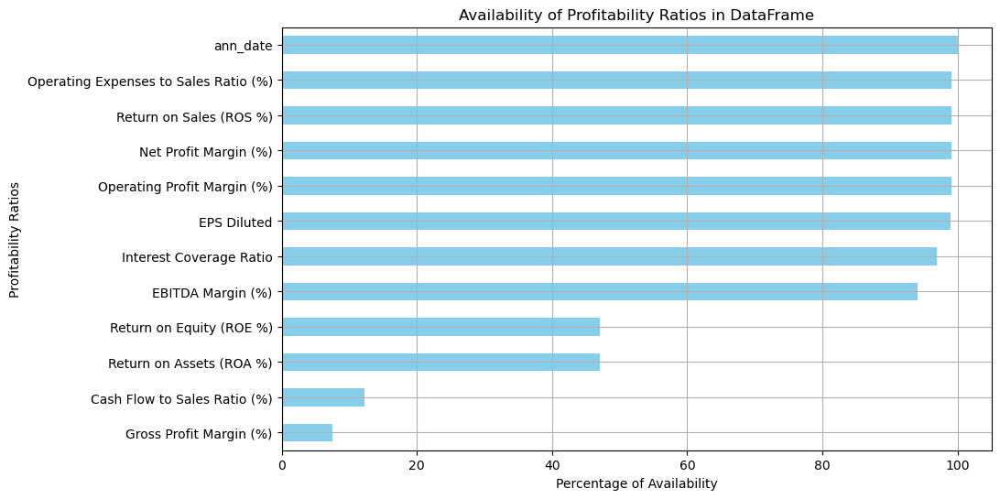

In [14]:
# Checking the availability of the ratio columns (Non-NaN values) in percentage
ratio_columns = [
    'Gross Profit Margin (%)', 'Operating Profit Margin (%)', 'Net Profit Margin (%)', 
    'Return on Assets (ROA %)', 'Return on Equity (ROE %)', 'EBITDA Margin (%)', 
    'Return on Sales (ROS %)', 'Cash Flow to Sales Ratio (%)', 'EPS Diluted', 
    'Operating Expenses to Sales Ratio (%)', 'Interest Coverage Ratio', 'ann_date'
]

# Calculate the availability percentage for each ratio column
availability = filtered_df[ratio_columns].notnull().mean() * 100

# Display the availability percentages
print("Availability of Ratio Columns (in %):")
print(availability)

# Plot the availability percentages for better visualization
plt.figure(figsize=(10, 6))
availability.sort_values().plot(kind='barh', color='skyblue')
plt.title('Availability of Profitability Ratios in DataFrame')
plt.xlabel('Percentage of Availability')
plt.ylabel('Profitability Ratios')
plt.grid(True)
plt.show()


# Profitability Z-Scored by Sector

In [18]:
profitability_columns = [
    'Gross Profit Margin (%)',
    'Operating Profit Margin (%)',
    'Net Profit Margin (%)',
    'Return on Assets (ROA %)',
    'Return on Equity (ROE %)',
    'EBITDA Margin (%)',
    'Return on Sales (ROS %)',
    'Cash Flow to Sales Ratio (%)',
    'EPS Diluted',
    'Interest Coverage Ratio'
]

# Ensure the metrics are numeric
df_profitability[profitability_columns] = df_profitability[profitability_columns].apply(pd.to_numeric, errors='coerce')

# Check for NaN values in profitability metrics
print("NaN values in profitability metrics:\n", df_profitability[profitability_columns].isna().sum())

# Fill NaN values with the mean of the column
df_profitability[profitability_columns] = df_profitability[profitability_columns].fillna(df_profitability[profitability_columns].mean())

# Perform linear interpolation for missing profitability metrics, grouped by sector
df_profitability[profitability_columns] = df_profitability.groupby('sector')[profitability_columns].transform(lambda x: x.interpolate(method='linear'))

# Group by sector and calculate Z-scores for each metric within each sector
profitability_zscore = df_profitability.groupby('sector')[profitability_columns].transform(lambda x: zscore(x, nan_policy='omit'))

# Add Z-scores back to the original DataFrame with '_zscore' suffix for the column names
profitability_zscore.columns = [f'{col}_zscore' for col in profitability_columns]

# Combine the original DataFrame with the Z-scores
df_profitability_with_zscores = pd.concat([df_profitability[['nse_symbol', 'company_name', 'sector', 'ciq_ntrm_date', 'ann_date']], profitability_zscore], axis=1)

# Select only Z-scores and relevant columns
final_columns = ['nse_symbol', 'company_name', 'sector', 'ciq_ntrm_date', 'ann_date'] + [f"{col}_zscore" for col in profitability_columns]
df_profitability_with_zscores = df_profitability_with_zscores[final_columns]

# Display the head of the new DataFrame with Z-scores by sector
print("Profitability Data with Z-scores by Sector:\n", df_profitability_with_zscores.head())


NaN values in profitability metrics:
 Gross Profit Margin (%)         32103
Operating Profit Margin (%)       376
Net Profit Margin (%)             376
Return on Assets (ROA %)        20865
Return on Equity (ROE %)        20865
EBITDA Margin (%)                2787
Return on Sales (ROS %)           376
Cash Flow to Sales Ratio (%)    32276
EPS Diluted                      1652
Interest Coverage Ratio          1966
dtype: int64
Profitability Data with Z-scores by Sector:
   nse_symbol     company_name     sector ciq_ntrm_date   ann_date  \
0  20MICRONS  20 MICRONS LTD.  Materials         06/18 2018-08-08   
1  20MICRONS  20 MICRONS LTD.  Materials         09/18 2018-10-31   
2  20MICRONS  20 MICRONS LTD.  Materials         12/18 2019-02-07   
3  20MICRONS  20 MICRONS LTD.  Materials         03/19 2019-05-28   
4  20MICRONS  20 MICRONS LTD.  Materials         06/19 2019-08-13   

   Gross Profit Margin (%)_zscore  Operating Profit Margin (%)_zscore  \
0                       -0.011987   

# Value

In [21]:
# Define file paths
file_path_sector = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Value & Profitability (2014 - 2024)\Sector.txt"

value_columns = ['nse_pe', 'nse_pb', 'nse_bv_per_share', 'eps_on_stkdate', 'cons_eps_on_stkdate', 'ceps_on_stkdate', 'cons_ceps_on_stkdate', 'co_stkdate']

# Read the sector data (Sector.txt)
with open(file_path_sector, 'r') as file:
    content_sector = file.read()
data_sector = StringIO(content_sector)
df_sector = pd.read_csv(data_sector, sep='|', header=0)

# Creating the 'value' DataFrame by merging the relevant columns from price data with identity data
df_value = df_price[['company_name'] + value_columns].merge(
    df_identity[['company_name', 'nse_symbol']], how='inner', on='company_name')

# Add the sector column by merging with the sector data on 'nse_symbol'
df_value = df_value.merge(df_sector[['nse_symbol', 'sector']], how='left', on='nse_symbol')

# Reorder columns to place company_name next to nse_symbol and sector
cols = ['nse_symbol', 'company_name', 'sector'] + [col for col in df_value.columns if col not in ['nse_symbol', 'company_name', 'sector']]
df_value = df_value[cols]

# Display the head of the new 'value' DataFrame with sector information and reordered columns
print("Value Data with Sector and Reordered Columns:\n", df_value.head())


Value Data with Sector and Reordered Columns:
   nse_symbol     company_name     sector    nse_pe  nse_pb  nse_bv_per_share  \
0  20MICRONS  20 MICRONS LTD.  Materials  108.0230  1.5582           22.1405   
1  20MICRONS  20 MICRONS LTD.  Materials  105.5181  1.5221           22.1405   
2  20MICRONS  20 MICRONS LTD.  Materials  102.8567  1.4837           22.1405   
3  20MICRONS  20 MICRONS LTD.  Materials  100.0387  1.4431           22.1405   
4  20MICRONS  20 MICRONS LTD.  Materials  100.0387  1.4431           22.1405   

   eps_on_stkdate  cons_eps_on_stkdate  ceps_on_stkdate  cons_ceps_on_stkdate  \
0          0.3194              -0.6151           3.2914                2.3569   
1          0.3194              -0.6151           3.2914                2.3569   
2          0.3194              -0.6151           3.2914                2.3569   
3          0.3194              -0.6151           3.2914                2.3569   
4          0.3194              -0.6151           3.2914            

### Value Field Legend

nse_pe = NSE P/E  

nse_bv_per_share = NSE Book Value per Share  

eps_on_stkdate = Earnings Per Share  

ceps_on_stkdate = Cash Earnings Per Share

cons_eps_on_stkdate = Consolidated EPS  

cons_ceps_on_stkdate = Consolidated CEPS

Availability of Value Columns (in %):
nse_pe                  72.935182
nse_pb                  88.736192
nse_bv_per_share        94.640418
eps_on_stkdate          99.269561
cons_eps_on_stkdate     79.215246
ceps_on_stkdate         99.269561
cons_ceps_on_stkdate    79.215246
dtype: float64


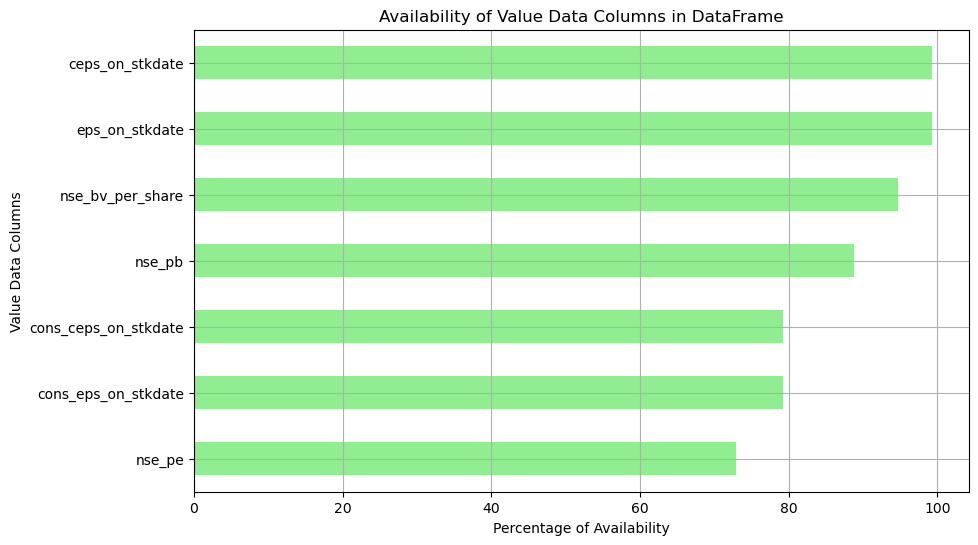

In [23]:
# Define the columns to check availability for
value_columns = ['nse_pe', 'nse_pb', 'nse_bv_per_share', 'eps_on_stkdate', 'cons_eps_on_stkdate', 
                 'ceps_on_stkdate', 'cons_ceps_on_stkdate']

# Check the availability of the columns (Non-NaN values) in percentage
availability = df_value[value_columns].notnull().mean() * 100

# Display the availability percentages
print("Availability of Value Columns (in %):")
print(availability)

# Plot the availability percentages for better visualization
plt.figure(figsize=(10, 6))
availability.sort_values().plot(kind='barh', color='lightgreen')
plt.title('Availability of Value Data Columns in DataFrame')
plt.xlabel('Percentage of Availability')
plt.ylabel('Value Data Columns')
plt.grid(True)
plt.show()


# Value Z-Scored by Sector

In [26]:
# Define your value columns (without adjusting P/E and P/B)
value_columns = ['nse_pe', 'nse_pb', 'nse_bv_per_share', 
                 'eps_on_stkdate', 'cons_eps_on_stkdate', 
                 'ceps_on_stkdate', 'cons_ceps_on_stkdate']

# Ensure that the necessary columns are numeric before calculating Z-scores
df_value[value_columns] = df_value[value_columns].apply(pd.to_numeric, errors='coerce')

# Group by sector and calculate Z-scores for the value metrics within each sector
df_value_zscore = df_value.groupby('sector')[value_columns].transform(lambda x: zscore(x, nan_policy='omit'))

# Invert the Z-scores for 'nse_pe' and 'nse_pb' by multiplying by -1
df_value_zscore['nse_pe'] = df_value_zscore['nse_pe'] * -1
df_value_zscore['nse_pb'] = df_value_zscore['nse_pb'] * -1

# Rename Z-score columns by appending '_zscore' to each value column
df_value_zscore.columns = [f'{col}_zscore' for col in value_columns]

# Combine the Z-scores with the non-numeric columns (nse_symbol, company_name, sector, and date)
df_final = pd.concat([df_value[['nse_symbol', 'company_name', 'sector', 'co_stkdate']], df_value_zscore], axis=1)

# Display the head of the DataFrame containing nse_symbol, company_name, sector, date, and Z-scores
print("Data with Z-scores and relevant columns:\n", df_final.head())


Data with Z-scores and relevant columns:
   nse_symbol     company_name     sector co_stkdate  nse_pe_zscore  \
0  20MICRONS  20 MICRONS LTD.  Materials 2014-09-01      -0.015531   
1  20MICRONS  20 MICRONS LTD.  Materials 2014-09-02      -0.014399   
2  20MICRONS  20 MICRONS LTD.  Materials 2014-09-03      -0.013197   
3  20MICRONS  20 MICRONS LTD.  Materials 2014-09-04      -0.011924   
4  20MICRONS  20 MICRONS LTD.  Materials 2014-09-05      -0.011924   

   nse_pb_zscore  nse_bv_per_share_zscore  eps_on_stkdate_zscore  \
0       0.079951                -0.488059              -0.333388   
1       0.080905                -0.488059              -0.333388   
2       0.081920                -0.488059              -0.333388   
3       0.082994                -0.488059              -0.333388   
4       0.082994                -0.488059              -0.333388   

   cons_eps_on_stkdate_zscore  ceps_on_stkdate_zscore  \
0                   -0.441951                -0.37052   
1             

# Composite Z-Score

In [29]:
def calculate_composite_zscore(df_value):
    # Step 1: Define the value columns (without adjusting P/E and P/B)
    value_columns = ['nse_pe', 'nse_pb', 'nse_bv_per_share', 
                     'eps_on_stkdate', 'cons_eps_on_stkdate', 
                     'ceps_on_stkdate', 'cons_ceps_on_stkdate']

    # Step 2: Ensure that the necessary columns are numeric before calculating Z-scores
    df_value[value_columns] = df_value[value_columns].apply(pd.to_numeric, errors='coerce')

    # Step 3: Group by sector and calculate Z-scores for the value metrics within each sector
    df_value_zscore = df_value.groupby('sector')[value_columns].transform(lambda x: zscore(x, nan_policy='omit'))

    # Step 4: Invert the Z-scores for 'nse_pe' and 'nse_pb' by multiplying by -1
    df_value_zscore['nse_pe'] = df_value_zscore['nse_pe'] * -1
    df_value_zscore['nse_pb'] = df_value_zscore['nse_pb'] * -1

    # Step 5: Rename Z-score columns by appending '_zscore' to each value column
    df_value_zscore.columns = [f'{col}_zscore' for col in value_columns]

    # Step 6: Combine the Z-scores with the non-numeric columns (nse_symbol, company_name, sector, and co_stkdate)
    df_final = pd.concat([df_value[['nse_symbol', 'company_name', 'sector', 'co_stkdate']], df_value_zscore], axis=1)

    # Step 7: Calculate the composite Z-score by averaging the available Z-scores and rename it to 'value_zscore'
    zscore_columns = [f'{col}_zscore' for col in value_columns]
    df_final['value_zscore'] = df_final[zscore_columns].mean(axis=1, skipna=True)

    return df_final

# Usage example
df_value_with_composite = calculate_composite_zscore(df_value)

# Display the first few rows of the DataFrame containing nse_symbol, sector, co_stkdate, and value_zscore
print("Data with Value Z-score:\n", df_value_with_composite[['nse_symbol', 'company_name', 'sector', 'co_stkdate', 'value_zscore']].head())


Data with Value Z-score:
   nse_symbol     company_name     sector co_stkdate  value_zscore
0  20MICRONS  20 MICRONS LTD.  Materials 2014-09-01     -0.287391
1  20MICRONS  20 MICRONS LTD.  Materials 2014-09-02     -0.287093
2  20MICRONS  20 MICRONS LTD.  Materials 2014-09-03     -0.286776
3  20MICRONS  20 MICRONS LTD.  Materials 2014-09-04     -0.286441
4  20MICRONS  20 MICRONS LTD.  Materials 2014-09-05     -0.286441


In [30]:
# Define the metrics for composite Z-score calculation
composite_metrics = [
    'EPS Diluted_zscore',
    'EBITDA Margin (%)_zscore',
    'Return on Equity (ROE %)_zscore',
    'Operating Profit Margin (%)_zscore'
]

# Calculate the average composite Z-score, accounting for missing values
df_profitability_with_zscores['profitability_zscore'] = df_profitability_with_zscores[composite_metrics].mean(axis=1, skipna=True)

# Select only the relevant columns including the profitability Z-score
final_columns_with_composite = ['nse_symbol', 'company_name', 'sector', 'ciq_ntrm_date', 'ann_date', 'profitability_zscore']
df_profitability_with_composite = df_profitability_with_zscores[final_columns_with_composite]

# Display the head of the DataFrame with the selected columns
print("Profitability Data with Selected Columns:\n", df_profitability_with_composite.head())


Profitability Data with Selected Columns:
   nse_symbol     company_name     sector ciq_ntrm_date   ann_date  \
0  20MICRONS  20 MICRONS LTD.  Materials         06/18 2018-08-08   
1  20MICRONS  20 MICRONS LTD.  Materials         09/18 2018-10-31   
2  20MICRONS  20 MICRONS LTD.  Materials         12/18 2019-02-07   
3  20MICRONS  20 MICRONS LTD.  Materials         03/19 2019-05-28   
4  20MICRONS  20 MICRONS LTD.  Materials         06/19 2019-08-13   

   profitability_zscore  
0             -0.166205  
1             -0.170196  
2             -0.189620  
3             -0.148238  
4             -0.158755  


# Merged Dataframe

In [32]:
# Merge function to combine value_zscore and profitability_zscore, including ciq_ntrm_date
def merge_value_and_profitability(df_value_with_composite, df_profitability_with_composite):
    # Perform the merge on 'nse_symbol', 'company_name', 'sector' and ensure 'co_stkdate' matches 'ann_date'
    merged_df = pd.merge(
        df_value_with_composite,
        df_profitability_with_composite,
        how='inner',  # Only merge rows with matching dates and other columns
        left_on=['nse_symbol', 'company_name', 'sector', 'co_stkdate'],
        right_on=['nse_symbol', 'company_name', 'sector', 'ann_date']
    )
    
    # Select the relevant columns after merging
    merged_df = merged_df[['nse_symbol', 'company_name', 'sector', 'co_stkdate', 'ciq_ntrm_date', 'value_zscore', 'profitability_zscore']]

    # Calculate the average of value_zscore and profitability_zscore
    merged_df['average_zscore'] = (merged_df['value_zscore'] + merged_df['profitability_zscore']) / 2

    return merged_df

# Assuming df_value_with_composite and df_profitability_with_composite are your two dataframes

# Example of merging the two dataframes
merged_df = merge_value_and_profitability(df_value_with_composite, df_profitability_with_composite)

# Display the merged DataFrame
print("Merged DataFrame with Value and Profitability Z-scores:\n", merged_df.head())


Merged DataFrame with Value and Profitability Z-scores:
   nse_symbol     company_name     sector co_stkdate ciq_ntrm_date  \
0  20MICRONS  20 MICRONS LTD.  Materials 2018-08-08         06/18   
1  20MICRONS  20 MICRONS LTD.  Materials 2018-10-31         09/18   
2  20MICRONS  20 MICRONS LTD.  Materials 2019-02-07         12/18   
3  20MICRONS  20 MICRONS LTD.  Materials 2019-05-28         03/19   
4  20MICRONS  20 MICRONS LTD.  Materials 2019-08-13         06/19   

   value_zscore  profitability_zscore  average_zscore  
0     -0.233725             -0.166205       -0.199965  
1     -0.228560             -0.170196       -0.199378  
2     -0.229091             -0.189620       -0.209356  
3     -0.216568             -0.148238       -0.182403  
4     -0.203121             -0.158755       -0.180938  


In [33]:
def get_last_co_stkdate_per_stock(merged_df):
    # Convert ciq_ntrm_date to datetime for easier handling
    merged_df['ciq_ntrm_date'] = pd.to_datetime(merged_df['ciq_ntrm_date'], format='%m/%y') + pd.offsets.MonthEnd(0)
    
    # Group by 'ciq_ntrm_date' and 'nse_symbol' and get the latest 'co_stkdate' for each group
    last_co_stkdate_df = merged_df.loc[merged_df.groupby(['ciq_ntrm_date', 'nse_symbol'])['co_stkdate'].idxmax()]
    
    return last_co_stkdate_df

# Assuming merged_df is already defined from the previous script
last_co_stkdate_df = get_last_co_stkdate_per_stock(merged_df)

# Display the DataFrame with the last available co_stkdate per stock
print("DataFrame with the Last co_stkdate for Each Unique ciq_ntrm_date and Stock:\n", last_co_stkdate_df.head())


DataFrame with the Last co_stkdate for Each Unique ciq_ntrm_date and Stock:
       nse_symbol                company_name               sector co_stkdate  \
9115    INOXWIND              INOX WIND LTD.          Industrials 2015-05-11   
885     AJRINFRA  A J R INFRA & TOLLING LTD.          Industrials 2014-11-14   
3322       CAIRN   CAIRN INDIA LTD. [MERGED]  Energy & Utilities  2015-04-23   
679      ADVANTA       ADVANTA LTD. [MERGED]     Consumer Staples 2014-10-31   
5838  ESSARPORTS            ESSAR PORTS LTD.          Industrials 2014-11-14   

     ciq_ntrm_date  value_zscore  profitability_zscore  average_zscore  
9115    2013-12-31     -0.055738             -0.041606       -0.048672  
885     2014-03-31     -0.210134             -0.050642       -0.130388  
3322    2014-03-31      0.065870              0.136461        0.101166  
679     2014-06-30     -0.680744             -0.065212       -0.372978  
5838    2014-06-30     -0.144510             -0.034450       -0.089480  


In [34]:
# Get the unique 'ciq_ntrm_date' values and sort them in ascending order
unique_dates = merged_df['ciq_ntrm_date'].unique()
unique_dates = np.sort(unique_dates)

# Initialize an empty list to store the top 30 stocks for each date
top_30_stocks_list = []

# Loop through each unique date
for date in unique_dates:
    # Filter merged_df to only include rows with the current 'ciq_ntrm_date'
    current_period_data = merged_df[merged_df['ciq_ntrm_date'] == date]
    
    # Get the number of unique stocks
    unique_stocks_count = current_period_data['nse_symbol'].nunique()
    
    # Print the number of unique stocks for the current period
    print(f"Date: {date}, Number of Unique Stocks: {unique_stocks_count}")

    # Check if there are at least 30 unique stocks
    if unique_stocks_count < 30:
        continue  # Skip this period if there are less than 30 unique stocks

    # Select the top 30 rows based on 'average_zscore'
    top_30_stocks = current_period_data.nlargest(30, 'average_zscore')[['nse_symbol', 'company_name', 'sector', 'co_stkdate', 'ciq_ntrm_date']]
    
    # Append the top 30 stocks for the current date to the list
    top_30_stocks_list.append(top_30_stocks)

# Create a DataFrame that keeps track of the top 30 stocks for each unique 'ciq_ntrm_date'
top_30_stocks_df = pd.concat(top_30_stocks_list, ignore_index=True)

# Display the resulting DataFrame
print("\nTop 30 Stocks for Each Unique ciq_ntrm_date (with at least 30 unique stocks):\n", top_30_stocks_df)


Date: 2013-12-31T00:00:00.000000000, Number of Unique Stocks: 1
Date: 2014-03-31T00:00:00.000000000, Number of Unique Stocks: 2
Date: 2014-06-30T00:00:00.000000000, Number of Unique Stocks: 6
Date: 2014-09-30T00:00:00.000000000, Number of Unique Stocks: 259
Date: 2014-12-31T00:00:00.000000000, Number of Unique Stocks: 266
Date: 2015-03-31T00:00:00.000000000, Number of Unique Stocks: 276
Date: 2015-06-30T00:00:00.000000000, Number of Unique Stocks: 293
Date: 2015-09-30T00:00:00.000000000, Number of Unique Stocks: 265
Date: 2015-12-31T00:00:00.000000000, Number of Unique Stocks: 285
Date: 2016-03-31T00:00:00.000000000, Number of Unique Stocks: 295
Date: 2016-06-30T00:00:00.000000000, Number of Unique Stocks: 288
Date: 2016-09-30T00:00:00.000000000, Number of Unique Stocks: 279
Date: 2016-12-31T00:00:00.000000000, Number of Unique Stocks: 294
Date: 2017-03-31T00:00:00.000000000, Number of Unique Stocks: 281
Date: 2017-06-30T00:00:00.000000000, Number of Unique Stocks: 299
Date: 2017-09-30

# Timelapse

Number of entries before conversion: 21070
Number of entries after conversion: 21070


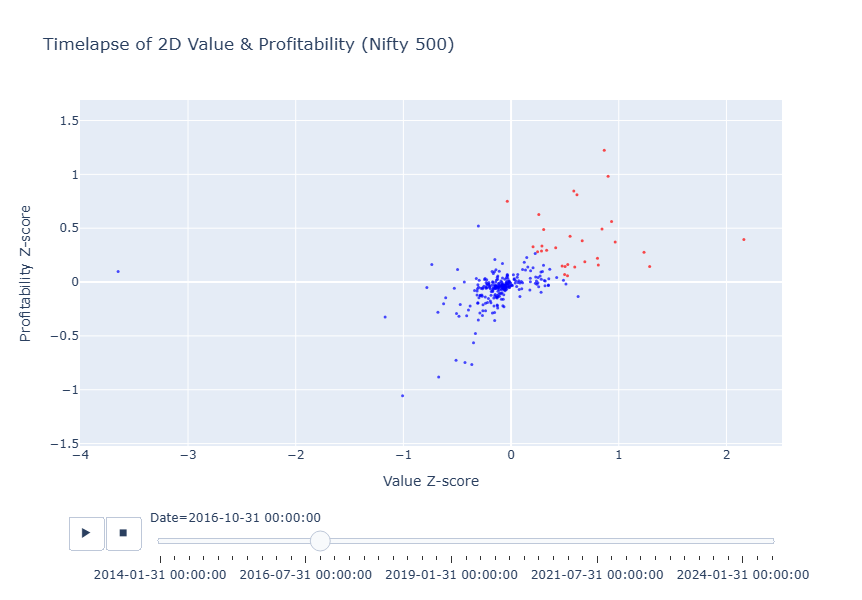

In [37]:
def convert_mm_yy_to_datetime_end_of_month(merged_df):
    # Print the number of entries before conversion
    print("Number of entries before conversion:", len(merged_df))
    
    # Convert dates in MM/YY format to datetime format assuming the end of the month
    merged_df['ciq_ntrm_date'] = pd.to_datetime(merged_df['ciq_ntrm_date'], format='%m/%y', errors='coerce')

    # Move the date to the end of the month
    merged_df['ciq_ntrm_date'] = merged_df['ciq_ntrm_date'] + pd.offsets.MonthEnd(1)

    # Drop any rows where the date conversion failed
    merged_df = merged_df.dropna(subset=['ciq_ntrm_date'])
    
    # Print the number of entries after conversion
    print("Number of entries after conversion:", len(merged_df))

    return merged_df

def plot_timelapse_value_vs_profitability(merged_df):
    # Clean and convert the dates in MM/YY format, assuming end of the month
    merged_df = convert_mm_yy_to_datetime_end_of_month(merged_df)

    # Sort the DataFrame by date to ensure chronological order
    merged_df = merged_df.sort_values(by='ciq_ntrm_date')

    # Create a combined metric (e.g., the average of value_zscore and profitability_zscore)
    merged_df['combined_metric'] = (merged_df['value_zscore'] + merged_df['profitability_zscore']) / 2

    # Create a column that flags the top 30 stocks in each time period based on combined_metric
    merged_df['top_30'] = merged_df.groupby('ciq_ntrm_date')['combined_metric'].rank(method='first', ascending=False) <= 30

    # Create an interactive animated scatterplot using Plotly
    fig = px.scatter(
        merged_df,
        x='value_zscore',
        y='profitability_zscore',
        animation_frame='ciq_ntrm_date',
        hover_data=['nse_symbol', 'company_name', 'combined_metric'],  # Add combined metric to hover information
        labels={
            'value_zscore': 'Value Z-score', 
            'profitability_zscore': 'Profitability Z-score',
            'ciq_ntrm_date': 'Date'
        },
        title='Timelapse of Value vs. Profitability Z-scores',
    )

    # Update marker properties for top 30 stocks to be red
    for frame in fig.frames:
        current_date = frame.name
        current_data = merged_df[merged_df['ciq_ntrm_date'] == current_date]
        frame.data[0].marker.color = current_data['top_30'].map({True: 'red', False: 'blue'})

        # Update the title to show the number of stocks
        num_stocks = len(current_data)
        frame.layout.title.text = f'Timelapse of 2D Value & Profitability (Nifty 500)'

    # Adjust marker size and opacity for better visibility
    fig.update_traces(marker=dict(size=3, opacity=0.7))

    # Set consistent axis scaling for a square plot
    fig.update_layout(
        width=600,
        height=600,
        xaxis=dict(scaleanchor='y', scaleratio=1),
    )

    # Show the interactive animated plot
    fig.show()

# Usage example for creating the timelapse
plot_timelapse_value_vs_profitability(merged_df)

# Zero-Cost Simulation

Converting 'ciq_ntrm_date' to datetime format...
Successfully converted 'ciq_ntrm_date'.
Grouping by 'ciq_ntrm_date' and 'nse_symbol' to get the latest 'co_stkdate'...
Successfully retrieved the last co_stkdate per stock.
Extracting unique 'ciq_ntrm_date' values...
Processing date: 2014-01-31T00:00:00.000000000
Skipping date 2014-01-31T00:00:00.000000000 as it has less than 30 unique stocks (only 1 available).
Processing date: 2014-04-30T00:00:00.000000000
Skipping date 2014-04-30T00:00:00.000000000 as it has less than 30 unique stocks (only 2 available).
Processing date: 2014-07-31T00:00:00.000000000
Skipping date 2014-07-31T00:00:00.000000000 as it has less than 30 unique stocks (only 6 available).
Processing date: 2014-10-31T00:00:00.000000000
Selecting top 30 stocks for date 2014-10-31T00:00:00.000000000...
Successfully selected top 30 stocks for date 2014-10-31T00:00:00.000000000.
Processing date: 2015-01-31T00:00:00.000000000
Selecting top 30 stocks for date 2015-01-31T00:00:00.0

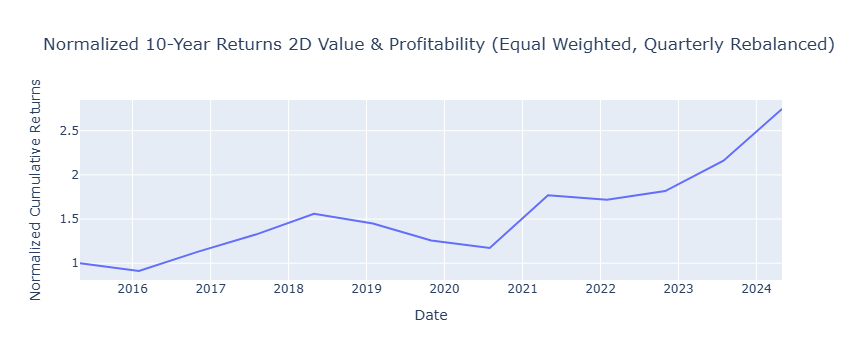

In [39]:
# Step 1: Get the Last co_stkdate for Each Unique ciq_ntrm_date and Stock
def get_last_co_stkdate_per_stock(merged_df):
    try:
        print("Converting 'ciq_ntrm_date' to datetime format...")
        merged_df['ciq_ntrm_date'] = pd.to_datetime(merged_df['ciq_ntrm_date'], format='%m/%y') + pd.offsets.MonthEnd(0)
        print("Successfully converted 'ciq_ntrm_date'.")
        
        print("Grouping by 'ciq_ntrm_date' and 'nse_symbol' to get the latest 'co_stkdate'...")
        merged_df['co_stkdate'] = pd.to_datetime(merged_df['co_stkdate'], format='%m/%y') + pd.offsets.MonthEnd(0)
        last_co_stkdate_df = merged_df.loc[merged_df.groupby(['ciq_ntrm_date', 'nse_symbol'])['co_stkdate'].idxmax()]
        print("Successfully retrieved the last co_stkdate per stock.")
    except Exception as e:
        print(f"Error in get_last_co_stkdate_per_stock: {e}")
        return pd.DataFrame()  # Return an empty DataFrame in case of error

    return last_co_stkdate_df

last_co_stkdate_df = get_last_co_stkdate_per_stock(merged_df)
if last_co_stkdate_df.empty:
    print("No data returned in last_co_stkdate_df. Please check the input data.")
    exit()

# Step 2: Get the Top 30 Stocks per Unique ciq_ntrm_date
print("Extracting unique 'ciq_ntrm_date' values...")
unique_dates = last_co_stkdate_df['ciq_ntrm_date'].unique()
unique_dates = np.sort(unique_dates)
top_30_stocks_list = []

for date in unique_dates:
    print(f"Processing date: {date}")
    current_period_data = last_co_stkdate_df[last_co_stkdate_df['ciq_ntrm_date'] == date]
    unique_stocks_count = current_period_data['nse_symbol'].nunique()

    if unique_stocks_count < 30:
        print(f"Skipping date {date} as it has less than 30 unique stocks (only {unique_stocks_count} available).")
        continue

    print(f"Selecting top 30 stocks for date {date}...")
    try:
        top_30_stocks = current_period_data.nlargest(30, 'average_zscore')[['nse_symbol', 'company_name', 'sector', 'co_stkdate', 'ciq_ntrm_date']]
        top_30_stocks_list.append(top_30_stocks)
        print(f"Successfully selected top 30 stocks for date {date}.")
    except Exception as e:
        print(f"Error while selecting top 30 stocks for date {date}: {e}")

top_30_stocks_df = pd.concat(top_30_stocks_list, ignore_index=True) if top_30_stocks_list else pd.DataFrame()
if top_30_stocks_df.empty:
    print("No top 30 stocks found for any period. Exiting...")
    exit()

# Step 3: Simulate an Equally Weighted Portfolio
print("Starting portfolio simulation...")
dts = top_30_stocks_df['ciq_ntrm_date'].unique()
dts = np.sort(dts)
rebalannceFreq = 3  # Quarterly Rebalancing
portfolio_returns = []

for idx in range(0, len(dts) - rebalannceFreq, rebalannceFreq):
    dt = dts[idx]
    tplus = dts[idx + rebalannceFreq - 1]
    print(f"Rebalancing period from {dt} to {tplus}")

    available_data = top_30_stocks_df[top_30_stocks_df['ciq_ntrm_date'] == dt]
    if available_data.empty:
        print(f"No available data for date {dt}. Skipping rebalancing period.")
        continue

    if len(available_data) < 30:
        print(f"Less than 30 stocks available for the date {dt}. Skipping period.")
        continue

    print(f"Calculating returns for the top 30 stocks for rebalancing period starting on {dt}...")
    top_30_stocks = available_data['nse_symbol'].tolist()
    period_returns = []

    for stock in top_30_stocks:
        try:
            intraPeriodPrices = df_adjprices[
                (df_adjprices['nse_symbol'] == stock) &
                (df_adjprices['co_stkdate'] >= dt) &
                (df_adjprices['co_stkdate'] <= tplus)
            ].sort_values(by='co_stkdate')['adjPrice'].ffill()

            if intraPeriodPrices.empty:
                print(f"No price data found for stock {stock} between {dt} and {tplus}.")
                continue

            intraPeriodRets = np.log(intraPeriodPrices / intraPeriodPrices.shift(1)).dropna()
            if intraPeriodRets.empty:
                print(f"No returns calculated for stock {stock} between {dt} and {tplus}.")
                continue

            cumulative_return = np.exp(intraPeriodRets.sum()) - 1
            period_returns.append(cumulative_return)
        except Exception as e:
            print(f"Error calculating returns for stock {stock} between {dt} and {tplus}: {e}")

    if period_returns:
        portfolio_return = np.mean(period_returns)
    else:
        print(f"No valid returns for the period from {dt} to {tplus}. Assuming portfolio return is 0.")
        portfolio_return = 0

    portfolio_returns.append({
        'start_date': dt,
        'end_date': tplus,
        'portfolio_return': portfolio_return
    })

# Step 4: Create DataFrame for Portfolio Returns and Plot Results
if portfolio_returns:
    portfolio_df = pd.DataFrame(portfolio_returns)
    
    # Calculate cumulative returns for the portfolio
    portfolio_df['cumulative_return'] = (1 + portfolio_df['portfolio_return']).cumprod()

    # Normalize the portfolio to start at 1
    portfolio_df['normalized_return'] = portfolio_df['cumulative_return'] / portfolio_df['cumulative_return'].iloc[0]

    print("Plotting normalized portfolio returns...")
    fig = go.Figure()

    fig.add_trace(go.Scatter(
        x=portfolio_df['end_date'],
        y=portfolio_df['normalized_return'],
        mode='lines',
        name='Normalized Portfolio Returns (Starting at 1)'
    ))

    fig.update_layout(
        title='Normalized 10-Year Returns 2D Value & Profitability (Equal Weighted, Quarterly Rebalanced)',
        xaxis_title='Date',
        yaxis_title='Normalized Cumulative Returns',
        legend_title='Portfolio',
        template='plotly'
    )

    fig.show()
else:
    print("No portfolio returns were generated. Please check the input data.")


Converting 'ciq_ntrm_date' to datetime format...
Successfully converted 'ciq_ntrm_date'.
Grouping by 'ciq_ntrm_date' and 'nse_symbol' to get the latest 'co_stkdate'...
Successfully retrieved the last co_stkdate per stock.
Plotting portfolio and benchmark returns...


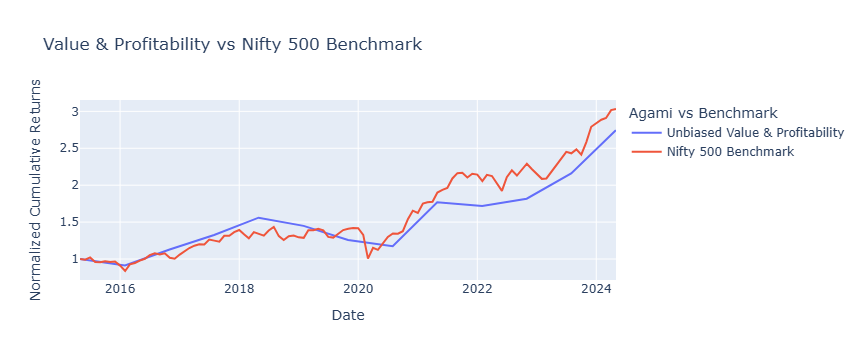

In [40]:
# Define the file path
file_path = r"C:\Users\apark\OneDrive\Desktop\Nifty 500 Historical Data.xlsx"

# Load the Nifty 500 Historical Data from the provided file path
nifty_500_data = pd.read_excel(file_path, sheet_name='Nifty 500 Historical Data (2)')

# Step 1: Get the Last co_stkdate for Each Unique ciq_ntrm_date and Stock
def get_last_co_stkdate_per_stock(merged_df):
    try:
        print("Converting 'ciq_ntrm_date' to datetime format...")
        merged_df['ciq_ntrm_date'] = pd.to_datetime(merged_df['ciq_ntrm_date'], format='%m/%y') + pd.offsets.MonthEnd(0)
        print("Successfully converted 'ciq_ntrm_date'.")
        
        print("Grouping by 'ciq_ntrm_date' and 'nse_symbol' to get the latest 'co_stkdate'...")
        merged_df['co_stkdate'] = pd.to_datetime(merged_df['co_stkdate'], format='%m/%y') + pd.offsets.MonthEnd(0)
        last_co_stkdate_df = merged_df.loc[merged_df.groupby(['ciq_ntrm_date', 'nse_symbol'])['co_stkdate'].idxmax()]
        print("Successfully retrieved the last co_stkdate per stock.")
    except Exception as e:
        print(f"Error in get_last_co_stkdate_per_stock: {e}")
        return pd.DataFrame()  # Return an empty DataFrame in case of error

    return last_co_stkdate_df

# Assume merged_df is already defined somewhere earlier in your script
last_co_stkdate_df = get_last_co_stkdate_per_stock(merged_df)
if last_co_stkdate_df.empty:
    print("No data returned in last_co_stkdate_df. Please check the input data.")
    exit()

# Step 4: Merge with Nifty 500 Historical Data and Plot Both
if portfolio_returns:
    portfolio_df = pd.DataFrame(portfolio_returns)
    
    # Calculate cumulative returns for the portfolio
    portfolio_df['cumulative_return'] = (1 + portfolio_df['portfolio_return']).cumprod()

    # Normalize the portfolio to start at 1
    portfolio_df['normalized_return'] = portfolio_df['cumulative_return'] / portfolio_df['cumulative_return'].iloc[0]

    # Load and process the Nifty 500 data
    nifty_500_data['Date'] = pd.to_datetime(nifty_500_data['Date'])
    nifty_500_data = nifty_500_data.sort_values(by='Date')

    # Calculate cumulative returns for the Nifty 500 and normalize to start at 1
    nifty_500_data['normalized_return'] = nifty_500_data['Price'] / nifty_500_data['Price'].iloc[0]

    print("Plotting portfolio and benchmark returns...")
    fig = go.Figure()

    # Add portfolio returns to the plot
    fig.add_trace(go.Scatter(
        x=portfolio_df['end_date'],
        y=portfolio_df['normalized_return'],
        mode='lines',
        name='Unbiased Value & Profitability'
    ))

    # Add Nifty 500 benchmark returns to the plot
    fig.add_trace(go.Scatter(
        x=nifty_500_data['Date'],
        y=nifty_500_data['normalized_return'],
        mode='lines',
        name='Nifty 500 Benchmark'
    ))

    fig.update_layout(
        title='Value & Profitability vs Nifty 500 Benchmark',
        xaxis_title='Date',
        yaxis_title='Normalized Cumulative Returns',
        legend_title='Agami vs Benchmark',
        template='plotly'
    )

    fig.show()
else:
    print("No portfolio returns were generated. Please check the input data.")
